# Automated Crop Damage Classification for Efficient Agricultural Risk Management.
![alt text](crop_image.jpg)

 **Authors:** `Dominic Mugo`, `Wayne Korir`, & `Celestine Imelda`.
 

## Project Background:

The "Eyes on the Ground" project is a collaborative effort involving ACRE Africa, the Kenya Agricultural & Livestock Research Organization (KALRO), the International Food Policy Research Institute (IFPRI), and the Lacuna Fund. The primary goal of this project is to harness the power of machine learning to enhance the efficiency of insurance claim verification and agricultural advisories for smallholder farmers in Africa.

ACRE Africa, in collaboration with KALRO, currently relies on image data to verify insurance claims and provide personalized agricultural advisories to farmers. The existing manual process of evaluating smartphone pictures of insured crops is time-consuming, leading to delays in claims settlement and increased costs for advisory services.

To address these challenges, the "Eyes on the Ground" project aims to automate image processing through the use of artificial intelligence. Leveraging machine learning algorithms will not only accelerate the claims settlement process but also enable the classification of crops into specific categories based on the type of damage they have suffered. This categorization includes Good growth (G), Drought (DR), Nutrient Deficient (ND), Weed (WD), and Other (including pest, disease, or wind damage).

## Problem Statement:

The current manual process of evaluating images for thousands of insured smallholder farmers is resource-intensive and time-consuming. This process significantly delays claims settlement and increases the overall costs associated with providing agricultural advisories. The need for a more efficient and scalable solution is evident.

The key problems to address include:
- **Manual Verification:** Manual verification of images for insurance claims and advisories is slow and labor-intensive.
- **Processing Costs:** The current process increases the costs of providing advisory services to farmers.
- **Timely Claims Settlement:** Delays in claims settlement impact farmers who depend on insurance payouts for their livelihoods.

## Project Objectives:

**Main Objective:**
The main objective of the "Eyes on the Ground" project is to develop a machine-learning algorithm for the automated classification of crops based on image data, facilitating faster and more accurate verification of insurance claims and providing timely and personalized agricultural advisories.

**Specific Objectives:**

### 1. Model Architecture Design:
   - Design an effective machine-learning model architecture tailored to the crop classification task. Consider using convolutional neural networks (CNNs) or transfer learning with pre-trained models for optimal feature extraction.

### 2. Model Training and Optimization:
   - Train the designed model on the labeled dataset, optimizing hyperparameters to enhance classification performance. Implement techniques such as regularization and dropout to mitigate overfitting and improve generalization.

### 3. Validation and Evaluation:
   - Conduct a comprehensive validation of the trained model using a separate dataset. Evaluate model performance metrics, including accuracy, precision, recall, and F1-score, to assess its effectiveness in classifying crops into predefined categories.

### 4. Deployment:
   - Deploy the trained model to a cloud-based platform, ensuring scalability and accessibility. Implement the necessary infrastructure to handle incoming image data for real-time classification. Provide integration support to seamlessly incorporate the model into the existing workflow of ACRE Africa and KALRO.

By focusing on these specific objectives, your team will play a crucial role in the core aspects of model development, training, validation, and deployment, contributing to the successful implementation of the machine-learning model for crop classification
### 5. Stakeholders
1. ACRE Africa
2. The Kenya Agricultural & Livestock Research Organization (KALRO)
3. The International Food Policy Research Institute (IFPRI)
4.  The Lacuna Fund in the "Eyes on the Ground" project.


# Data Exploration and Understanding

## Overview

We began by exploring and understanding the dataset to gain insights into its structure and characteristics.


## Data Understanding

In [1]:
# Import OS-related libraries
import os 
import shutil
import zipfile

# Import Computer Vision libraries
import cv2
from PIL import ImageOps, Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

# Import Data Manipulation libraries
import pandas as pd
import numpy as np
import random
import base64

# Import Machine Learning and Deep Learning libraries
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.optimizers import Adam
from keras.models import load_model




In [2]:
# read test data
test_data = pd.read_csv('./Test.csv', header=0)

# inspect first five rows of test data
test_data.head()

,ID,filename
0,ID_QW9GQM,03428805a0d7d269b422dbfafb3f86cb394a0491.jpg
1,ID_G9VPQ9,5dcf4f5d82708496ad7c3227ccbc8af5058aa227.jpg
2,ID_QIMIEM,4e835aa40e4aafa24db13cba4182094eb9e5eb79.jpg
3,ID_TSINUQ,1e0dbb8669385be73a480ce108d12bdc4354f120.jpg
4,ID_I7OOHH,3d05e31502f9f00ce25770666c73af5f323a8b3a.jpg


In [3]:
# check shape of test_data
test_data.shape

(8663, 2)

In [4]:
# get basic information on test_data
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8663 entries, 0 to 8662
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID        8663 non-null   object
 1   filename  8663 non-null   object
dtypes: object(2)
memory usage: 135.5+ KB


In [5]:
# read training data into a dataframe
training_data = pd.read_csv('./Train.csv', header=0)

# inspect first five entries
training_data.head()

,ID,damage,filename
0,ID_UBHORS,WD,d036341be8d6cd59851cb80bcc9a70cc9fbdba30.jpg
1,ID_9DSOLZ,G,9ea16180c50d0cd539897eefbfe585314e50a56b.jpg
2,ID_JHLM0G,G,b6b564844041bc68774a553eaf43d61654657dd9.jpg
3,ID_ATREIJ,DR,62262859f0cd411aaf484082ed3ef0b625bc452a.jpg
4,ID_L2GAD6,G,03b6e2a8ace7cb611eccba289f3c83d9bd497584.jpg


In [6]:
training_data.shape

(26068, 3)

In [7]:
training_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26068 entries, 0 to 26067
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID        26068 non-null  object
 1   damage    26068 non-null  object
 2   filename  26068 non-null  object
dtypes: object(3)
memory usage: 611.1+ KB


### Data Structure

The training dataset consisted of 26,068 datapoints and had the following columns:

- **ID:** A unique identifier for each data entry.
- **Damage:** The type of damage, including categories such as Good (G), Weed (WD), Drought (DR), and others.
- **Filename:** The name of the image file associated with each entry.

Here's a snapshot of the head of the training data:


|    | ID        | Damage | Filename                                     |
|----|-----------|--------|----------------------------------------------|
| 0  | ID_UBHORS | WD     | d036341be8d6cd59851cb80bcc9a70cc9fbdba30.jpg |
| 1  | ID_9DSOLZ | G      | 9ea16180c50d0cd539897eefbfe585314e50a56b.jpg |
| 2  | ID_JHLM0G | G      | b6b564844041bc68774a553eaf43d61654657dd9.jpg |
| 3  | ID_ATREIJ | DR     | 62262859f0cd411aaf484082ed3ef0b625bc452a.jpg |
| 4  | ID_L2GAD6 | G      | 03b6e2a8ace7cb611eccba289f3c83d9bd497584.jpg |

On the other hand, the test set consists of 8,663 datapoints and had only the **ID:** and **Filename:**  columns:

Below is the head of the test data:


|    | ID        | Filename                                     |
|----|-----------|----------------------------------------------|
| 0  | ID_ABCXYZ | abcxyz.jpg                                   |
| 1  | ID_DEF123 | def123.jpg                                   |
| 2  | ID_XYZ456 | xyz456.jpg                                   |
| 3  | ID_123ABC | 123abc.jpg                                   |
| 4  | ID_ABC456 | abc456.jpg                                   |


### Damage Types

The dataset includes the following damage types (for training data), along with their definitions:

| Damage | Definition          |
|--------|---------------------|
| DR     | Drought             |
| G      | Good (growth)       |
| ND     | Nutrient Deficient  |
| WD     | Weed                |
| other  | Disease, Pest, Wind |

*Note: The test data does not include damage labels; it only contains the ID and filename columns.*


## Data Exploration - Training Data

Since the test data is meant for model evaluation and also due to the limited information in the test set, in our data exploration will focus on the training data.

In [8]:
# image directory
img_dir = './images'

In [9]:
# get a list of all image names in the image directory 
image_names = os.listdir(img_dir)

In [10]:
# distribution of damage types
train_damage_freq = training_data['damage'].value_counts(normalize=True)

train_damage_freq

damage
G        0.445872
WD       0.354381
DR       0.173239
other    0.016073
ND       0.010434
Name: proportion, dtype: float64

In [11]:
# Create a directory for plots
logs_dir = './plots/'
os.makedirs(logs_dir, exist_ok=True)

In [14]:
def bar_plotter(value_counts, x_label, y_label, plot_title, fig_name, color_scheme='viridis'):
    # Plot distribution of types of damage
    
    # create a figure and axis
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # set X and y for our bar chart
    y = value_counts.values
    x = value_counts.index
    
    # plot bar graph 
    bars = ax.bar(height=y, x=x, width=0.6, color=plt.get_cmap(color_scheme)(range(len(x))))
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(plot_title)
    
    # add annotations to each bar
    for bar in bars:
        yval = bar.get_height()
        ax.annotate(round(yval, 2), # rounded value
                    xy=(bar.get_x() + bar.get_width() / 2, yval),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')
    plot_path = os.path.join('./plots', fig_name)
    plt.savefig(plot_path)


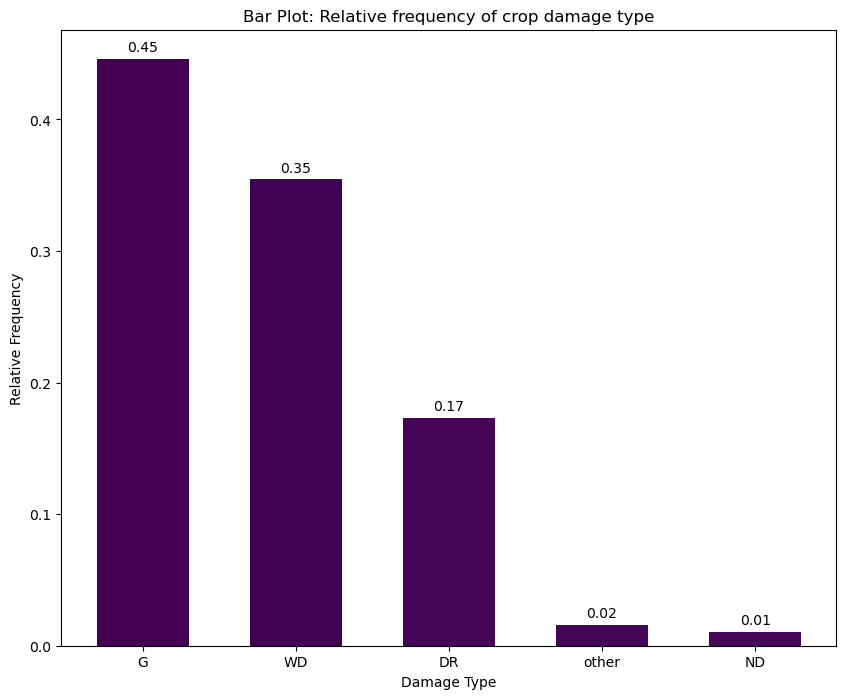

In [15]:
bar_plotter(train_damage_freq, 'Damage Type', 'Relative Frequency', 'Bar Plot: Relative frequency of crop damage type', 'Crop Damage Histogram')

### Damage Type Distribution Analysis

#### Observations:

1. **Good (G): 44.59%**
   - The most prevalent damage type, representing a substantial portion of the dataset.

2. **Weed (WD): 35.44%**
   - The second most common category, contributing significantly to the dataset.

3. **Drought (DR): 17.32%**
   - Less frequent than Good and Weed but still a notable portion of the dataset.

4. **Other (Disease, Pest, Wind): 1.61%**
   - A relatively infrequent category, representing a small portion of the dataset.

5. **Nutrient Deficient (ND): 1.04%**
   - Similar to 'Other,' Nutrient Deficient is a less frequent type in# the dataset.



### Exploring Damage Types Through Visualizations
In order to gain a more comprehensive insight into the image data we analyzed, we employed visualization techniques to examine representative images from each damage type. This allowed us to develop a visual understanding of the dataset.


In [16]:
damage_types = {'WD':'Weeds', 'G':'Good Growth', 'DR':'Drought', 
                'ND':'Nutrient Deficiency', 'other':'Other Damage'}

In [17]:
# getting sample of 5 images for each damage type
sample_images = training_data.groupby('damage').sample(4, random_state=42)

In [18]:
def multi_image_plotter(image_dir, image_names, fig_title):
    import matplotlib.image as mpimg

    
    # Set up the subplot grid
    num_images = len(image_names)
    num_cols = 2
    num_rows = (num_images + 1) // num_cols  # Ensure there is at least one row

    # Create a figure and axis
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 12))

    # Flatten the 2D array of subplots if there is only one row
    axes = axes.flatten()

    # Loop through the images and display them in subplots
    for i, image_name in enumerate(image_names):
        img = mpimg.imread(os.path.join(image_dir, image_name))  # Assuming your images are in a directory named "images"
        
        axes[i].imshow(img)
        axes[i].axis('off')  # Turn off axis labels for cleaner display
        axes[i].set_title(f"Image {i + 1}")
    
    # Adjust layout for better spacing and place suptitle
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    fig.suptitle(fig_title, y=0.98)

    plt.show()

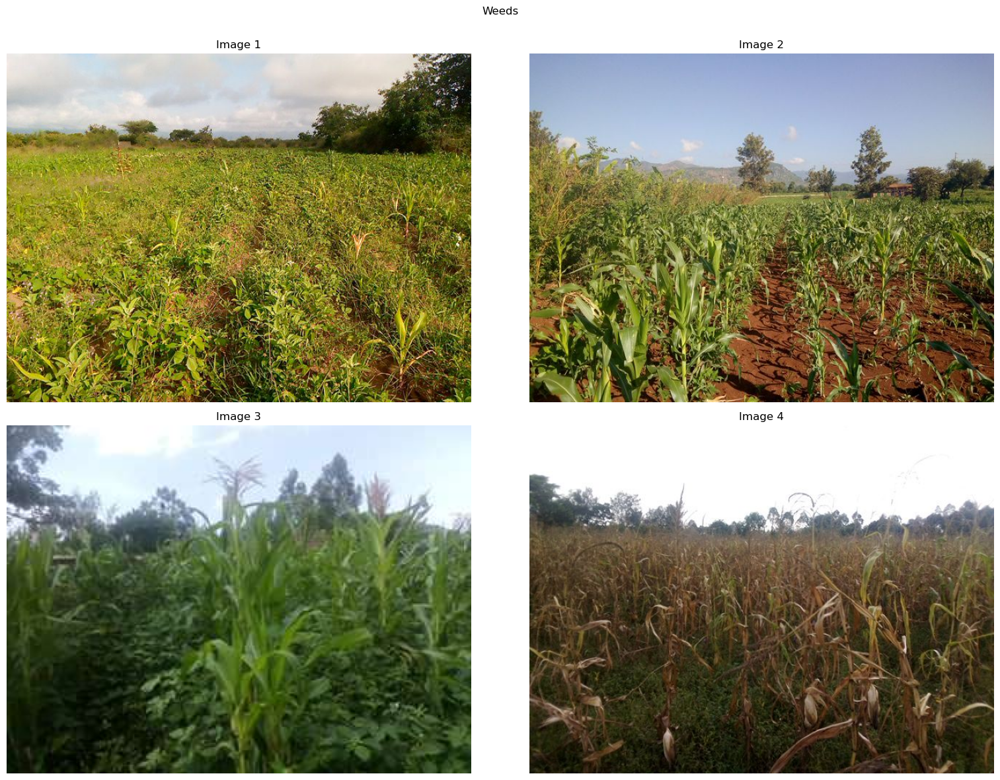

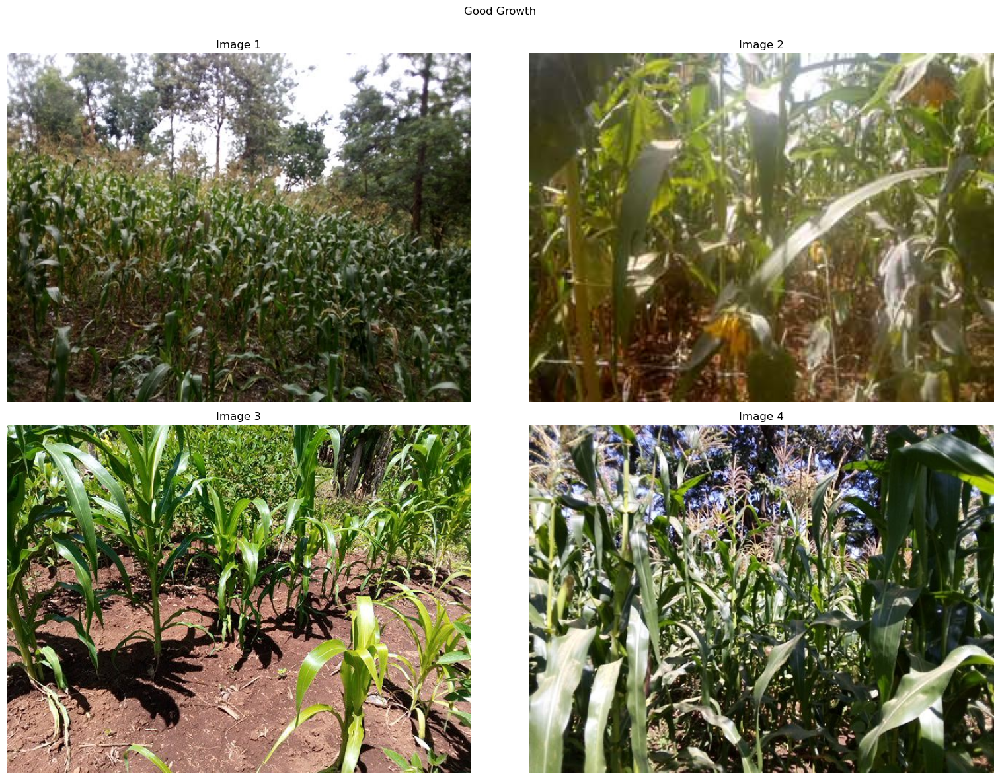

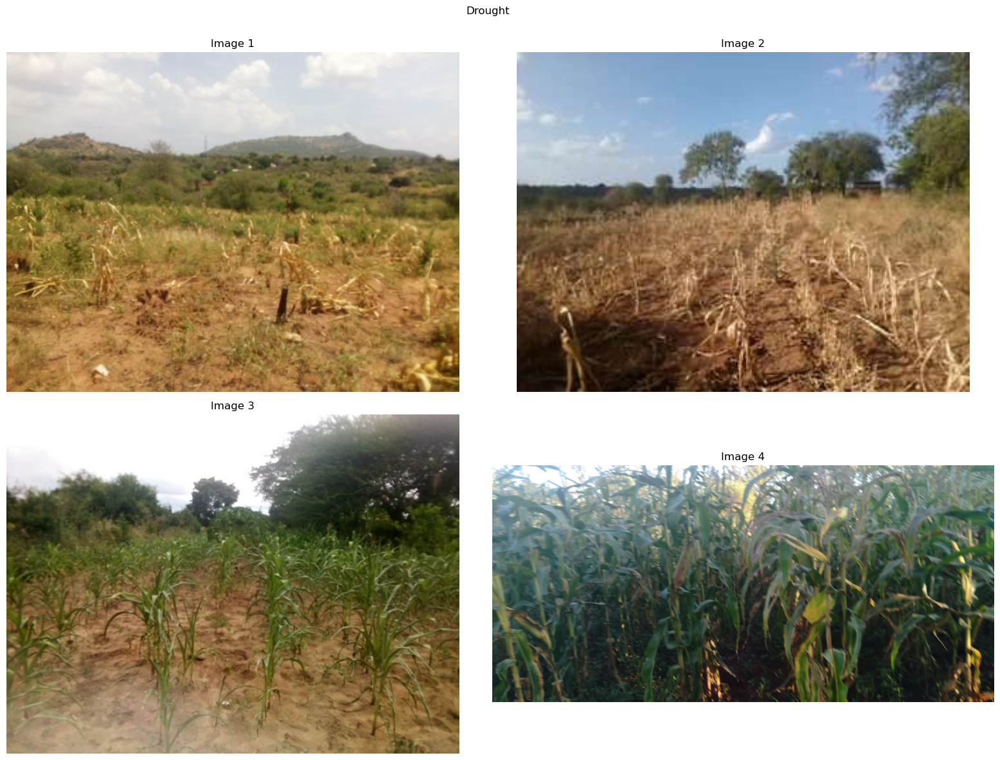

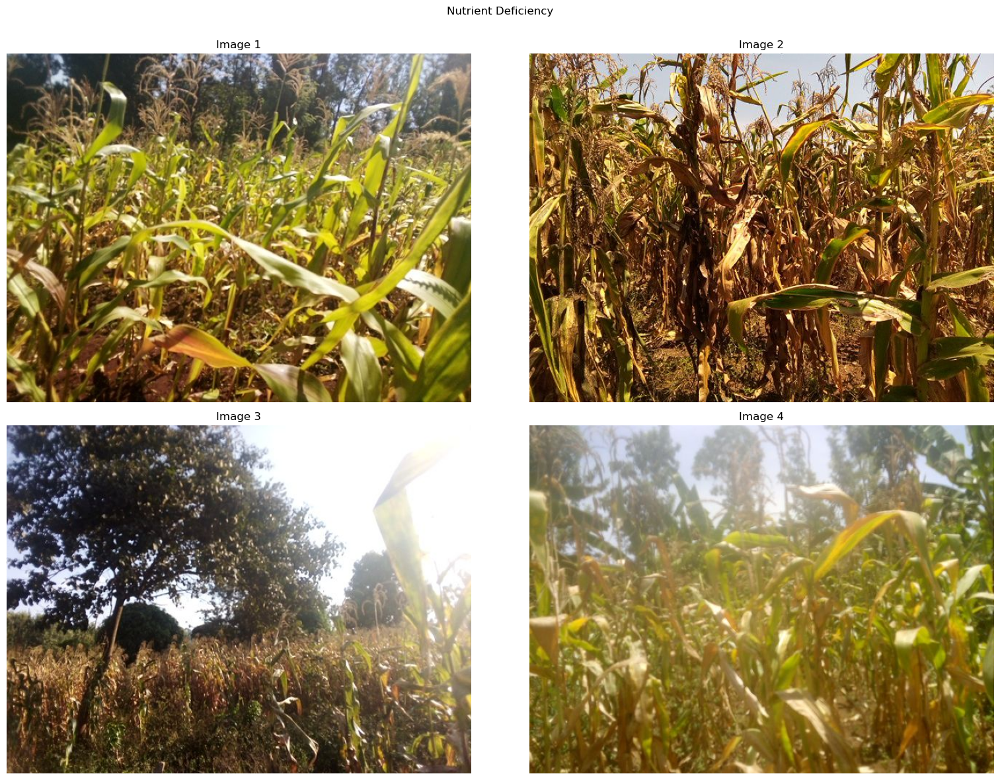

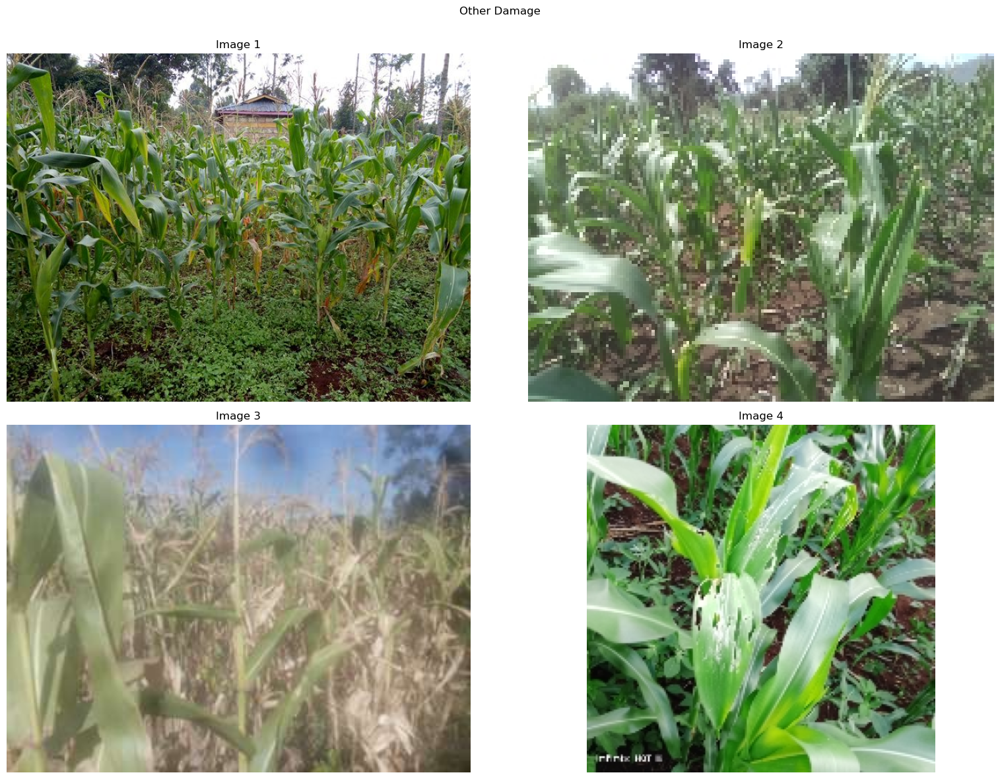

In [19]:
# Visualize images from each damage types
for damage_type_abv, damage_type in damage_types.items():
    image_names = sample_images[sample_images['damage'] == damage_type_abv]['filename']
    multi_image_plotter(img_dir, image_names, damage_type)
    
    

### Image Size & Total Pixels Distribution
Next, we investigated the distribution of image sizes and total pixels, providing valuable insights for the data preprocessing step.

Image size refers to the dimensions of an image, typically measured in pixels. It is represented by two values: width and height. For example, an image with a size of 800x600 pixels has a width of 800 pixels and a height of 600 pixels.

**Why is Image Size Important?**

1. **Uniformity in Model Training:** Machine learning models, especially deep learning models, often require input images to have consistent dimensions. A consistent image size ensures that the model can effectively learn patterns and features across the dataset.

2. **Computational Efficiency:** Consistent image sizes can lead to computational efficiency during model training and inference. Batch processing is more streamlined when images have the same dimensions.

3. **Resource Management:** Image size can impact the memory and processing power required for handling the dataset. Understanding the distribution of image sizes helps in efficient resource allocation.

**Total Pixels Distribution**

Total pixels was calculated by multiplying the number of pixels in the width (W) and the number of pixels in the height (H) of each image, using the formula:

$\text{Total Pixels} = \text{Width} \times \text{Height}$



In [20]:
train_image_names = training_data['filename'].values

In [21]:
# generate list of random indices 
import random
random.seed(42)

image_indices = np.random.randint(low=0, 
                                  high=len(train_image_names), 
                                  size=10000)
# randomly select 1000 images from the dataset
random_img_names = [train_image_names[index] for index in image_indices]

# generate file paths for the 100000 selected images
random_img_paths = [os.path.join(img_dir, image_name) for image_name in random_img_names]

# get total pixes of each image and store in a list
# initialize list to store image sizes
sample_image_pixels = []
image_sizes = []
# loop through list of selected image paths
for path in random_img_paths:
    # open image 
    with Image.open(path) as img:
        img_size = img.size # get size of image (300, 300)
        image_sizes.append(img_size)
        total_pixels = img_size[0] * img_size[1] # get total number of pixels in the image
        sample_image_pixels.append(total_pixels) # append total number of pixesl in the image to list

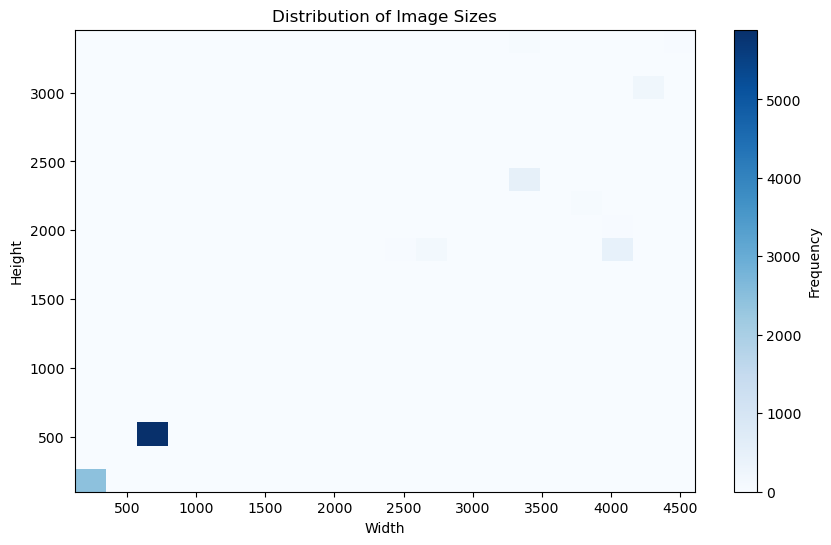

In [82]:
# Extract width and height from tuples
widths, heights = zip(*image_sizes)

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.hist2d(widths, heights, bins=(20, 20), cmap=plt.cm.Blues)
plt.colorbar(label='Frequency')
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Distribution of Image Sizes')
plt.savefig('./plots/image_size_dist')
plt.show()

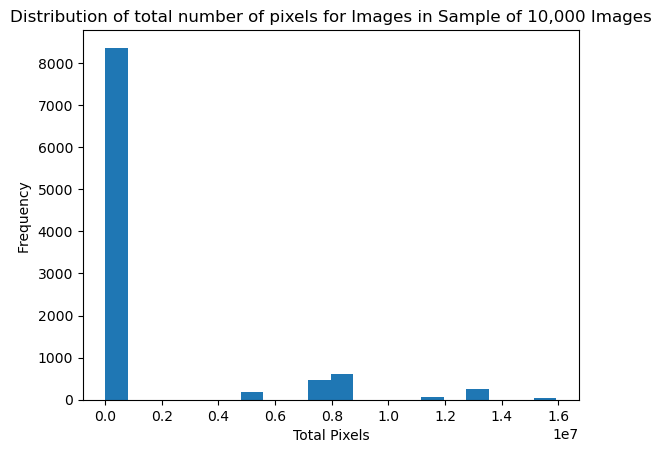

In [81]:
# check the distribution of the number of pixels
plt.hist(sample_image_pixels, bins=20)
plt.title('Distribution of total number of pixels for Images in Sample of 10,000 Images')
plt.xlabel('Total Pixels')
plt.ylabel('Frequency ')
plt.savefig('./plots/pixel_dist_1')
plt.show();

In [24]:
majority_images = [pixel for pixel in sample_image_pixels if pixel < 0.2e7]

In [25]:
len(majority_images)

8364

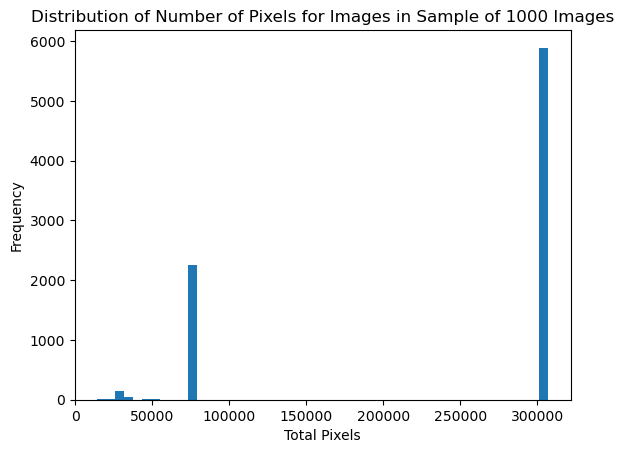

In [80]:
# check the distribution of the number of pixels
plt.hist(majority_images, bins=50)
plt.title('Distribution of Number of Pixels for Images in Sample of 1000 Images')
plt.xlabel('Total Pixels')
plt.ylabel('Frequency')
plt.savefig('./plots/pixel_dist_2')
plt.show();

In [27]:
# Create an empty list to store damage types for randomly selected images
random_damage_type = []

# Iterate through each image name in the list of randomly selected image names
for image_name in random_img_names:
    # Retrieve the damage type for the current image from the training data DataFrame
    # 'training_data' is the DataFrame containing image information
    # and 'filename' is the column containing image names
    damage_type = training_data[training_data['filename'] == image_name].damage.values[0]
    
    # Append the obtained damage type to the list
    random_damage_type.append(damage_type)

# Create a DataFrame with 'damage' and 'pixels' columns using the obtained data
pixels_damage_df = pd.DataFrame({'damage': random_damage_type, 'pixels': sample_image_pixels})

# Display the head of the resulting DataFrame
pixels_damage_df.head()


,damage,pixels
0,WD,76800
1,G,307200
2,G,307200
3,G,307200
4,G,7990272


C:\Users\user\AppData\Local\Temp\ipykernel_22736\3497818732.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='damage', y='pixels', data=pixels_damage_df, palette=custom_palette)


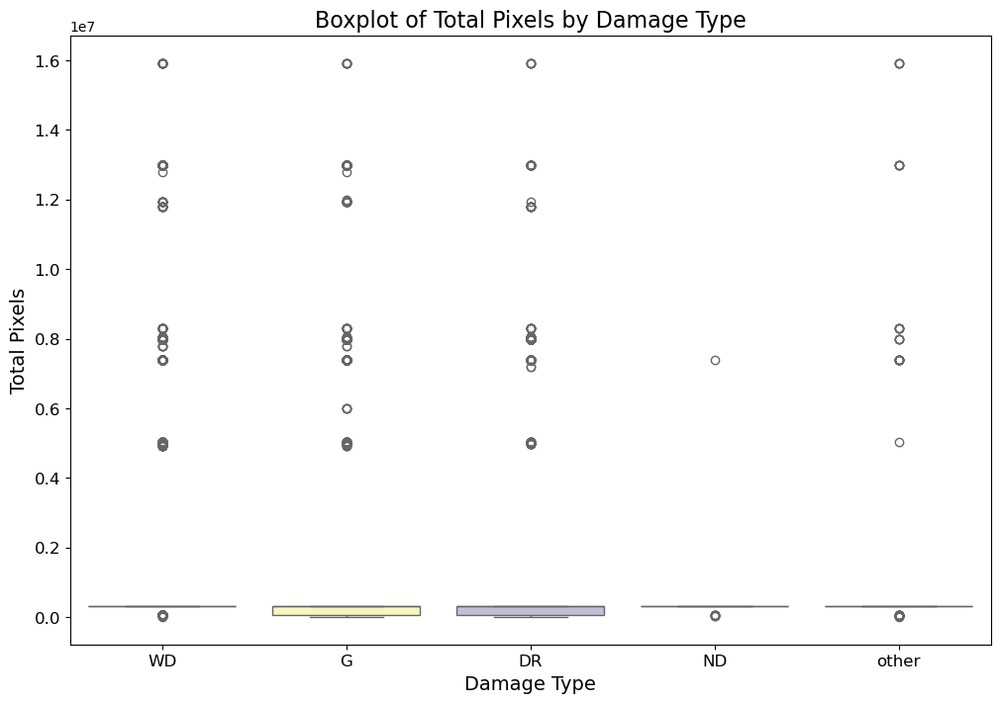

In [79]:
# Define a custom color palette
custom_palette = sns.color_palette("Set3", len(pixels_damage_df['damage'].unique()))

# Create a boxplot for Total Pixels grouped by Damage type
plt.figure(figsize=(12, 8))
sns.boxplot(x='damage', y='pixels', data=pixels_damage_df, palette=custom_palette)
plt.title('Boxplot of Total Pixels by Damage Type', fontsize=16)
plt.xlabel('Damage Type', fontsize=14)
plt.ylabel('Total Pixels', fontsize=14)
plt.xticks(fontsize=12)  # Adjust x-axis label font size
plt.yticks(fontsize=12)  # Adjust y-axis label font size
plt.savefig('./plots/damage_type_boxplot1')
plt.show()

In [29]:
# Threshold for filtering out pixels
pixel_threshold = 0.2e7

# Filter out rows where 'pixels' is greater than the threshold
filtered_pixels_damage_df = pixels_damage_df[pixels_damage_df['pixels'] <= pixel_threshold]

# Display the head of the filtered DataFrame
filtered_pixels_damage_df.head()


,damage,pixels
0,WD,76800
1,G,307200
2,G,307200
3,G,307200
5,DR,307200


C:\Users\user\AppData\Local\Temp\ipykernel_22736\4139077061.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='damage', y='pixels', data=filtered_pixels_damage_df, palette=custom_palette)


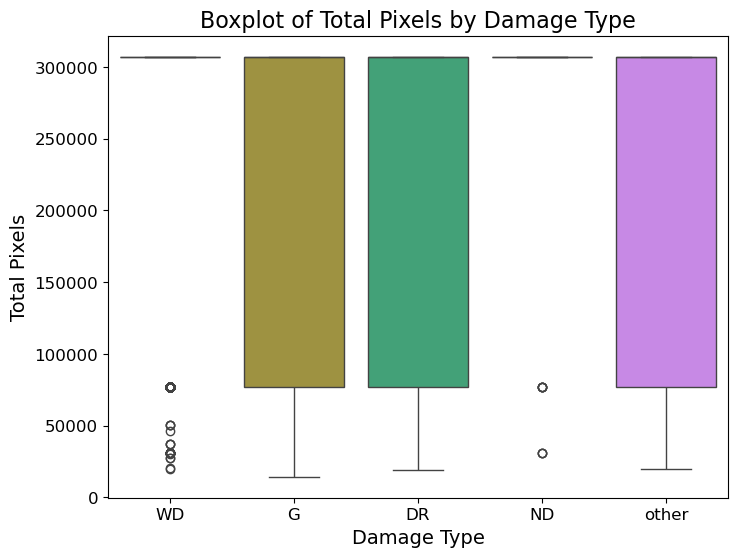

In [78]:

# Define a custom color palette
custom_palette = sns.color_palette("husl", len(filtered_pixels_damage_df['damage'].unique()))

# Create a boxplot for Total Pixels grouped by Damage type
plt.figure(figsize=(8, 6))
sns.boxplot(x='damage', y='pixels', data=filtered_pixels_damage_df, palette=custom_palette)
plt.title('Boxplot of Total Pixels by Damage Type', fontsize=16)
plt.xlabel('Damage Type', fontsize=14)
plt.ylabel('Total Pixels', fontsize=14)
plt.xticks(fontsize=12)  # Adjust x-axis label font size
plt.yticks(fontsize=12)  # Adjust y-axis label font size
plt.savefig('./plots/damage_type_boxplot2')
plt.show()

### Image Size Distribution Analysis:

#### Boxplots and Histograms of Total Pixels:

1. **Majority of Images with Low Pixel Count:**
   - Around 80% of the images in the dataset had a total number of pixels less than 400,000. This indicated that the majority of images have relatively low pixel counts.

2. **Concentration of Images around 300,000 Pixels:**
   - Approximately 65% of the images exhibited a total pixel count close to 300,000. This concentration suggests a commonality in image sizes within this range.

#### 2D Histplot Analysis:

1. **Prevalence of (640, 480) Image Size:**
   - Analysis of the dataset revealed that the most common image size is (640, 480), prevalent in more than 60% of the dataset. 

### Insights:

- **Image Size Consistency:** The concentration of images around a specific pixel count, especially the prevalence of (640, 480), suggested a degree of consistency in image sizes within the dataset.

- **Common Image Characteristics:** The prevalence of lower pixel counts and a dominant image size may influence preprocessing decisions and considerations during model training.


### Summary of EDA Insights:

1. **Damage Type Distribution:**
   - The dataset is dominated by the "Good" damage type (44.59%), followed by "Weed" (35.44%), "Drought" (17.32%), and a combined category of "Other" types (1.61%) and "Nutrient Deficient" (1.04%).

2. **Dominant Crop:**
   - Maize is the prevalent crop in the dataset, impacting the project's focus on machine learning models for maize damage classification.

3. **Image Size Distribution:**
   - The majority of images have low pixel counts (80% with < 400,000 pixels), with a concentration around 300,000 pixels. The most common image size is (640, 480), accounting for over 60% of the dataset.

4. **Implications for Analysis:**
   - Consistency in image sizes, especially the prevalence of (640, 480), suggests a uniformity that can inform preprocessing decisions and considerations during model training. The dominance of maize in the dataset highlights the need for specific focus in damage classification.


### Implications for the Project:

#### 1. Addressing Class Imbalance in Damage Types:

- Class imbalance was recognized as a potential challenge, prompting the need to ensure model generalization, particularly to edge cases.
- Strategies such as oversampling minority classes or undersampling majority classes were considered to balance the class distribution.
- Additionally, careful selection of evaluation metrics, using F1 score in addition to accuracy, to take into account the imbalanced nature of the dataset, emphasizing the importance of not relying solely on accuracy.
- Data augmentation was also another technique applied further address this issue.

#### 2. Standardizing Image Sizes:

- Given that varying sizes of images provided by the client, it was standardized image sizes to ensure consistent feature extraction in deep learning models.
- The most common image size, (640, 480), was chosen as the a standard image size for modeling. This size was selected to minimize distortion, preserving more information in the images.

**Implementation Note** Due to computational limitations of the model training tools used for the project, Kaggle notebooks and Colab, we had to settle for a smaller standard image size of (224, 224) in order to strike a balance between computational effieciency and information retention.  


#### 3. Removing Outliers:
- To avoid highly distorted images from influencing model performace, we planned to remove outliers. The engineered feature, total pixels, was used to filter out images that were extremely large or extremely small.

**Implementation Note** To avoid losing a significant portion of our training dataset, we opted to retain all images including those that were considered outliers. However, this was noted as a potential point of improvement should we have found the model to perform poorly.




# Data Preparation and Preprocessing

For the project, we leveraged the `ImageDataGenerator` class from the TensorFlow library for efficient data handling and preprocessing. This class streamlines several crucial preprocessing steps in a single operation:

1. **Image Scaling**
2. **Image Augmentation**
3. **Flipping**
4. **Blurring**
5. **Zooming**

### Data Organization
However, prior to initiating these processing steps, it was imperative to organize the images by class. Specifically, the training images were categorized into subdirectories based on their corresponding damage type labels. This organizational step was essential for the subsequent application of the `ImageDataGenerator` class.

### Class balancing
To address potential challenges associated with class imbalances within the image data, we implemented miniority class oversampling  prior to loading the images using the `ImageDataGenerator` class. To achieve this, a manual minority oversampling technique is applied. This ensures that each class is adequately represented, minimizing complications during model training.

In summary, the following sequential steps constitute the data preparation and preprocessing pipeline:

1. **Image Grouping by Class Label:**
   - Organizing the images into subdirectories according to their damage type labels.

2. **Class Balancing:**
   - Manual minority oversampling to mitigate class imbalances and ensure equitable representation.

3. **Data Preprocessing:**
   - Utilizing the `ImageDataGenerator` class for streamlined image scaling, augmentation, flipping, blurring, and zooming.

These meticulous preparations aim to enhance the model's robustness and generalization capabilities, paving the way for effective machine learning model training on the project dataset.


# Dividing the Dataset into Training and Testing Sets

As mentioned earlier, the test data supplied by the client lacked labels. Consequently, we chose to partition the provided training data into distinct train and test sets. This decision was made to guarantee the availability of a dedicated test set for evaluating our optimized model.

In [31]:
# Stratified train-test split
train_df, test_df = train_test_split(training_data, test_size=0.2, 
                                     stratify=training_data['damage'], 
                                     random_state=42)

# Display the resulting DataFrames
print("Training Set:")
print(train_df)

print("\nTest Set:")
print(test_df)


Training Set:
              ID damage                                      filename
5062   ID_ROOWKB     DR  a0c87fd202bddf915009c81c94321e13dc027ad3.jpg
23171  ID_NIYV7W      G  53c53382f863c403d6f2ec51444ceadd19c215c1.jpg
8432   ID_28S8IP     WD  f27265cafacebfc4bc4b83163331860f3a8504af.jpg
5632   ID_60DQDY      G  55d0b00768961e9e9c861555ae56c8926a65cd60.jpg
17875  ID_5J3MXA     WD  f8014ac5797cf00dfd10b8a9b1fef4972592b5ec.jpg
...          ...    ...                                           ...
16030  ID_0X4I8A     WD  66ac352e6b6ac5bb307c068b143bc91a79395589.jpg
18172  ID_QRH7RM     WD  24f5b4e4fd52013004d998094a8046329880458c.jpg
20232  ID_FB5AO8     DR  3132d408730568d4b00217de551ae95dd45b2a2c.jpg
2419   ID_T5C9JZ     WD  7d48426ed13b40c378432223d8964a268b151edf.jpg
26021  ID_T543PW      G  2d6b900344e35a11c368cf273357bfa3cf537254.jpg

[20854 rows x 3 columns]

Test Set:
              ID damage                                      filename
1715   ID_HRQTO0     WD  a02594b12b67f2

#### Organizing Images

In [32]:
# defining source and destination directories
source_dir = './imagess'
destination_base_dir = './organized_train_images/'

In [ ]:
# Create destination directories if they don't exist
for label in train_df['damage'].unique():
    destination_dir = os.path.join(destination_base_dir, label)
    os.makedirs(destination_dir, exist_ok=True)

# Move images to their respective directories
for index, row in train_df.iterrows():
    source_path = os.path.join(source_dir, row['filename'])
    destination_dir = os.path.join(destination_base_dir, row['damage'])
    destination_path = os.path.join(destination_dir, row['filename'])

    # Check if the source file exists before moving
    if os.path.exists(source_path):
        shutil.move(source_path, destination_path)
    else:
        print(f"Source file not found: {source_path}")

print("Data reorganization complete.")


In [33]:
# checking number of images in each directory to confirm data balancing was completed successfully
for dir in os.listdir(destination_base_dir):
    subdir = os.path.join(destination_base_dir, dir)
    print(len(os.listdir(subdir)))


11623
11623
11623
11623
11623


## Manual Minority Class Oversampling

In [ ]:

# Set the root directory
root_directory = destination_base_dir

# Set the target count for oversampling
target_count = max(train_df['damage'].value_counts())

# Get the list of subdirectories (categories)
subdirectories = [d for d in os.listdir(root_directory) if os.path.isdir(os.path.join(root_directory, d))]

# Loop through each subdirectory
for subdirectory in subdirectories:
    # Get the list of image files in the subdirectory
    images = [f for f in os.listdir(os.path.join(root_directory, subdirectory)) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Calculate oversampling factor and randomly select existing images for augmentation:
    images = [f for f in os.listdir(os.path.join(root_directory, subdirectory)) if f.endswith(('.jpg', '.jpeg', '.png'))]
    count = len(images)
    oversample_factor = target_count - count

    for i in range(oversample_factor):
        # Randomly select an existing image
        selected_image = random.choice(images)

        # Generate a new image name and path
        new_image_name = f"{subdirectory}_{count + i}_{selected_image}"  # Adjust naming to avoid overwriting
        new_image_path = os.path.join(root_directory, subdirectory, new_image_name)

        # Copy the selected image to create a new sample
        shutil.copyfile(os.path.join(root_directory, subdirectory, selected_image), new_image_path)

In [34]:
# checking number of images in each directory to confirm data balancing was completed successfully

for dir in os.listdir(destination_base_dir):
    subdir = os.path.join(destination_base_dir, dir)
    print(len(os.listdir(subdir)))


11623
11623
11623
11623
11623


#### Configuring Tensorflow GPU Usage
This code is used to set GPU memory growth for TensorFlow. In TensorFlow, by default, the GPU allocates all available GPU memory when a session is created. This behavior can lead to inefficient memory usage, especially when running multiple models on the same GPU.

In [35]:
# Set GPU memory growth
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)


#### Create directories to store models and logs

In [36]:
# Create a directory for the models
model_dir = './models/'
os.makedirs(model_dir, exist_ok=True)

# Create a directory for logs
logs_dir = './logs/'
os.makedirs(logs_dir, exist_ok=True)



### Memory-Efficient Data Loading and Preprocessing 
Given the substantial size of our dataset, employing traditional preprocessing techniques—such as loading the entire dataset into memory—would have posed significant memory challenges. In light of this, we opted for the use of the ImageDataGenerator.

By leveraging the ImageDataGenerator, we effectively sidestepped memory-intensive operations. This approach allowed us to dynamically preprocess and augment the data on-the-fly during training, providing a memory-efficient solution. This decision to ensured the scalability and feasibility of our data processing pipeline.


- The organized training images  stored in the base directory (`base_dir`), were resized them  (224, 224) pixels, processing them in batches of 256 during training.

- With the creation of the `train_datagen` instance, we implemented rescaling, shear, zoom, and horizontal flip augmentations to enhance the model's robustness.

- To standardize pixel values, we rescaled them to the range [0, 1].

- The data was split into training and validation sets using `validation_split=0.2`.

- Two distinct generators, `train_generator` and `validation_generator`, were established to facilitate the training and validation processes, respectively.



In [37]:
# Define the base directory containing the organized images
base_dir = './organized_train_images/'
# Specify the image size and batch size
image_size = (224, 224)
batch_size = 256

# Create an ImageDataGenerator for training data with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Rescale pixel values to the range [0, 1]
    shear_range=0.2, # data augmentation
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # Split data into training and validation sets
)

# Create a training dataset
train_generator = train_datagen.flow_from_directory(
    base_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    subset='training'  # Specify 'training' for the training set
)

# Create a validation dataset
validation_generator = train_datagen.flow_from_directory(
    base_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Specify 'validation' for the validation set
)


Found 46495 images belonging to 5 classes.
Found 11620 images belonging to 5 classes.


## Defining the base model
### CNN Model Architecture Summary
- The base model consisted of three convolutional layers with increasing filter sizes (32, 64, 128), each followed by max-pooling layers for down-sampling.
- After the convolutional layers, a flatten layer was added to transition from the convolutional part to the densely connected part.
- Two dense (fully connected) layers follow, with the first having 128 units and ReLU activation, including a dropout layer for regularization.
- The final dense layer has 5 units with softmax activation, since our a classification task had 5 classes.
- The model is compiled using the Adam optimizer, categorical crossentropy loss , and accuracy as the evaluation metric.

In [38]:
# Define the CNN model
model = models.Sequential()

# Convolutional layers
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Flatten layer
model.add(layers.Flatten())

# Dense (fully connected) layers
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))  # Dropout for regularization
model.add(layers.Dense(5, activation='softmax'))  # Assuming 5 classes

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Display the model summary
model.summary()





Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)     

### Defining callbacks and fitting the model

- With the model architecture defined, model checkpoint callbacks were established  to save the best-performing model during training:
- The callback, `model_checkpoint`, was configured to save only the best model based on the validation accuracy (`val_accuracy`).
- During training, the saved model was stored in the models directory, (`model_dir`), we created earlier with the filename 'best_model'.
- The model was trained for 20 epochs using the training and validation generators.

In [ ]:
# Define the model checkpoint callback without specifying options
model_checkpoint = ModelCheckpoint(
    filepath=os.path.join(model_dir, 'best_model'),
    save_best_only=True,
    monitor='val_accuracy',
    mode='max',
    verbose=1
)

# Train the model with the model_checkpoint callback
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    callbacks=[model_checkpoint]
)


## Base Model Evaluation

### Training and Validation Metrics Visualization

We visualized the training and validation performance metrics using two subplots:

#### Subplot 1: Loss

- Plotted the training and validation loss over epochs.
- The `Training Loss` curve demonstrates the model's loss on the training set.
- The `Validation Loss` curve represents the loss on the validation set.
- The goal is to observe trends in the model's convergence and identify potential overfitting or underfitting.

#### Subplot 2: Accuracy

- Plotted the training and validation accuracy over epochs.
- The `Training Accuracy` curve illustrates the model's accuracy on the training set.
- The `Validation Accuracy` curve depicts the accuracy on the validation set.
- This visualization aids in assessing the model's learning progress and generalization to unseen data.



In [75]:
#define function to plot curves from log data 

def plot_training_history(df, model_name, lr=False):
    # Plot training and validation loss
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 3, 1)
    plt.plot(df['epoch'], df['train_loss'], label='Training Loss')
    plt.plot(df['epoch'], df['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot training and validation accuracy
    plt.subplot(1, 3, 2)
    plt.plot(df['epoch'], df['train_accuracy'], label='Training Accuracy')
    plt.plot(df['epoch'], df['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    if lr:
        # Plot learning rate
        plt.subplot(1, 3, 3)
        plt.plot(df['epoch'], df['lr'], label='Learning Rate', color='red')
        plt.title('Learning Rate')
        plt.xlabel('Epoch')
        plt.ylabel('LR')
        plt.legend()
    if model_name:
        save_path = os.path.join('./plots/', model_name)
        plt.savefig(save_path)
    plt.tight_layout()
    plt.show()
    

In [40]:
# create dataframe from base_model training logs
best_base_model_logs_df = pd.read_csv('./logs/best_model_logs.csv')

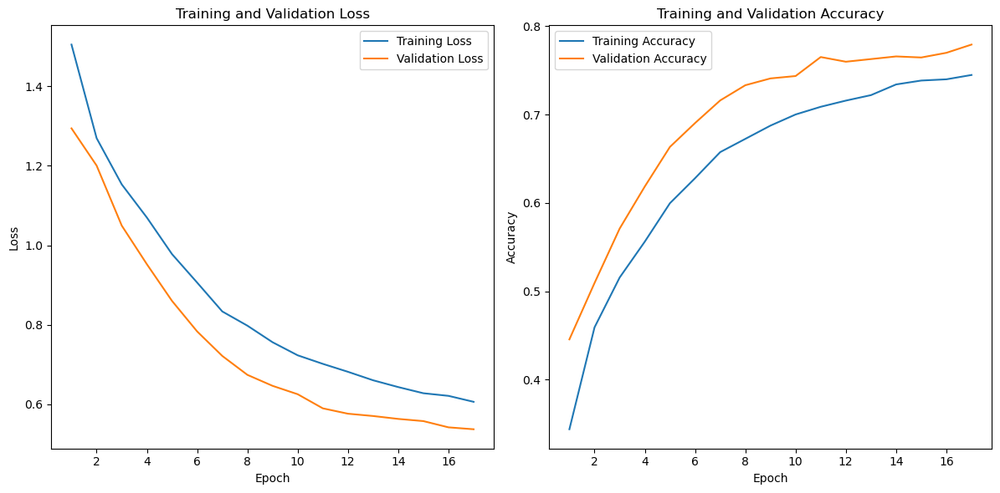

In [76]:
# plot curves of loss and accuracy for base model
plot_training_history(best_base_model_logs_df, model_name='base_model_loss_curves')

In [42]:
def classify(image_path, model):
    """
    This function takes an image, a model, and a list of class names and returns the predicted class and confidence
    score of the image.

    Parameters:
        image (PIL.Image.Image): An image to be classified.
        model (tensorflow.keras.Model): A trained machine learning model for image classification.
        class_names (list): A list of class names corresponding to the classes that the model can predict.

    Returns:
        The predicted class name class_labels  ('DR','G', 'ND', 'WD','other')
    """
    # define class labels
    class_labels = {0:'DR', 1:'G', 2:'ND', 3:'WD', 4:'other'}
    
    with Image.open(image_path) as image:
        # convert image to (224, 224)
        image = ImageOps.fit(image, (224, 224), Image.Resampling.LANCZOS)

        # convert image to numpy array
        image_array = np.asarray(image)

        # normalize image
        normalized_image_array = (image_array.astype(np.float32) / 255) 

        # set model input
        data = np.ndarray(shape=(1, 224, 224, 3), dtype=np.float32)
        data[0] = normalized_image_array

        # make prediction
        prediction = model.predict(data)

    return class_labels[np.argmax(prediction[0])]

In [43]:
# Get paths for test data
test_images_paths = [os.path.join('./images', filename) for filename in test_df.filename.values]

len(test_images_paths)

5214

In [44]:
# load model 
model = load_model('./models/best_model/')

In [45]:
# generate predictions 
test_data_predictions = [classify(image_path, model) for image_path in test_images_paths]

1/1 [==============================] - 0s 43ms/step


In [46]:
# make copy of test_df and add predictions column
test_pred_df = test_df.copy()
test_pred_df['predicted_damage_type'] = test_data_predictions

# inspect resulting dataframe
test_pred_df.head()

,ID,damage,filename,predicted_damage_type
1715,ID_HRQTO0,WD,a02594b12b67f2f0ef5357ad1cf5c98c5a27c91f.jpg,DR
5711,ID_7IQ4PP,G,b1c06732db11df12a6041c18231c62ff813e310d.jpg,G
17855,ID_QL81LS,WD,c0abfaf618ac60171988aec5d8a92c1eb0a554cb.jpg,WD
9587,ID_GU8EZS,G,a67f72906ad6baad9ac87962813069daf23d06e7.jpg,other
16372,ID_GFPPE9,G,acc0a8214106c55e6ef9f596920b39b159d7a3c9.jpg,WD


In [47]:
# define function to encode data to so that we can compare ground truth from predictions
def encode_test_data(test_df, test_pred_df):
    # import sklearn's label encoder
    from sklearn.preprocessing import LabelEncoder

    # prepare dataframes for encoding
    y = test_df.drop(columns=['ID', 'filename'])
    y_hat = test_pred_df.drop(columns=['ID', 'damage', 'filename'])

    # instantiate LabelEncoder
    lb_encoder = LabelEncoder()

    # fit encoder to data
    y_encoded = lb_encoder.fit_transform(y)
    y_hat_encoded = lb_encoder.transform(y_hat)

    return y_encoded, y_hat_encoded

In [63]:
# get f1 score, precision, recall, confusion matrix
def get_useful_metrics(y_true, y_pred):
    from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix
    f1 = f1_score(y_true, y_pred, average='micro')
    precision = precision_score(y_true, y_pred, average='micro')
    recall = recall_score(y_true, y_pred, average='micro')
    
    
    return f1, precision, recall

In [51]:
# get encoded y and y_hat

y, y_hat = encode_test_data(test_df, test_pred_df)

# Evaluate performance of model (f1, precision, recall, cm)

f1, precision, recall = get_useful_metrics(y, y_hat)

c:\Users\user\anaconda3\envs\spark-env\lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\user\anaconda3\envs\spark-env\lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


In [53]:
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

F1 Score: 0.5681
Precision: 0.5681
Recall: 0.5681


In [72]:
def plot_confusion_matrix(y_true, y_pred, model_name=''):
    from sklearn.metrics import confusion_matrix
    # Define class labels
    classes = ['DR', 'G', 'ND', 'WD','other']

    #Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Plotting the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=classes, yticklabels=classes)
    plt.title(f"Confusion Matrix {model_name}")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    save_path = os.path.join('./plots/', model_name)
    plt.savefig(save_path)
    plt.show()



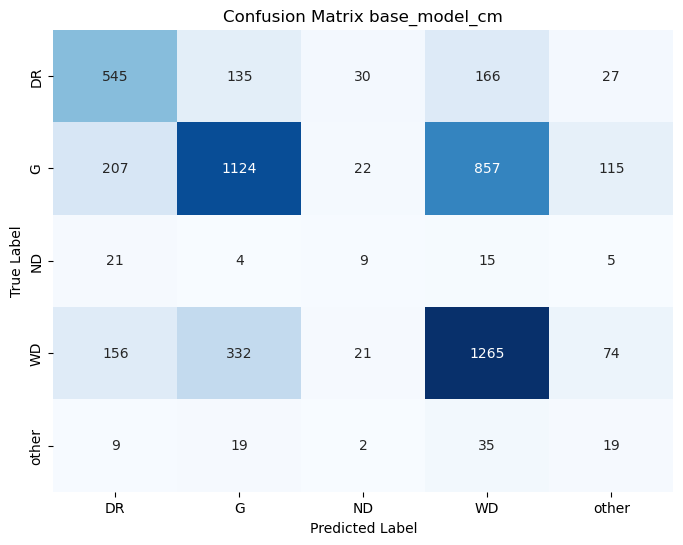

In [73]:
plot_confusion_matrix(y, y_hat, model_name='base_model_cm')

## Defining the Optimized Model
### CNN Model Architecture Summary

The optimized model builds upon the base architecture with enhancements for improved performance:

- The model began with three convolutional layers with increasing filter sizes (32, 64, 128), each followed by max-pooling layers for down-sampling.
- A deeper architecture was introduced with an additional convolutional layer, Conv2D(256, (3, 3)), and its corresponding max-pooling layer for enhanced feature extraction.
- The model further incorporates a wider architecture by adding another Conv2D(128, (3, 3)) layer with its associated max-pooling layer, contributing to increased model capacity.
- Following the convolutional layers, a flatten layer facilitates the transition to the densely connected part of the network.
- Two dense (fully connected) layers ensue, with the first layer comprising 128 units and ReLU activation, accompanied by a dropout layer for regularization.
- The final dense layer retains 5 units with softmax activation, aligning with the 5 classes in our classification task.
- The model is compiled using the Adam optimizer with a specified initial learning rate of 0.001, categorical crossentropy loss, and accuracy as the evaluation metric.

**Note:** Given the absence of overfitting concerns at 20 epochs, our intention was to extend the training duration by increasing the number of epochs. Unfortunately, this enhancement could not be implemented due to constraints in computational resources.


In [ ]:
# Define the CNN model
model = models.Sequential()

# Convolutional layers
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Deeper Architecture
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Wider Architecture
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

# Flatten layer
model.add(layers.Flatten())

# Dense (fully connected) layers
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))  # Dropout for regularization
model.add(layers.Dense(5, activation='softmax'))  # Assuming 5 classes

# Compile the model with Adam optimizer and initial learning rate
model.compile(optimizer=Adam(lr=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Display the model summary
model.summary()


#### Further Model Enhancements
In addition to buiding a deeper and wider model architecture, we also implemented a learning rate adjustment strategy. Using LearningRateScheduler and a learning rate schedule function, lr_schedule, we adjusted the learning rate during training epochs. The schedule function decreases the learning rate by a factor of 0.1 every 10 epochs.

In [ ]:
# Learning rate schedule function
def lr_schedule(epoch):
    return 0.001 * (0.1 ** (epoch // 10))

learning_rate_scheduler = LearningRateScheduler(lr_schedule)

In [ ]:
# Define the model checkpoint callback
model_checkpoint = ModelCheckpoint(
    filepath=os.path.join(model_dir, 'optimized_model'),
    save_best_only=True,
    monitor='val_accuracy',
    mode='max',
    verbose=1
)

# Train the model with adjustments and additional metrics
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    callbacks=[model_checkpoint, learning_rate_scheduler]
)

## Optimized Model Evaluation
Following a similar process as we did with the base model we also evaluated the performance of the optimized model.

In [58]:
# create dataframe from optimized_model training logs
optimized_base_model_logs_df = pd.read_csv('./logs/optimized_model_logs.csv')

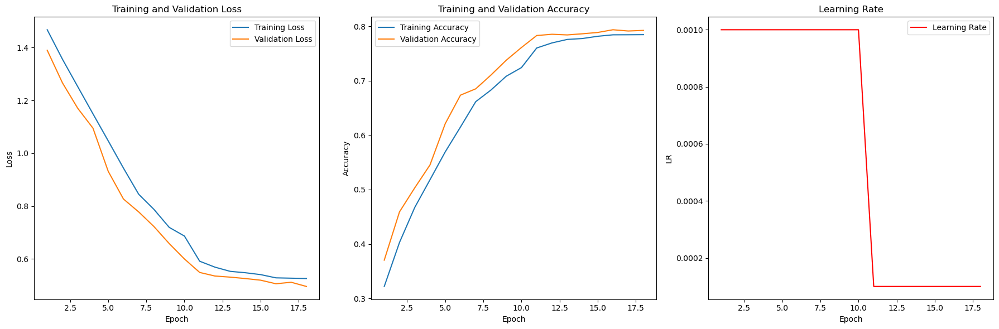

In [77]:
# plot curves of loss and accuracy for base model
plot_training_history(optimized_base_model_logs_df, lr=True, model_name='optimized_model_loss_curves')

In [60]:
# load optimized model
optimized_model = load_model('./models/optimized_model/')

In [61]:
# generate predictions using the optimized model and test data
om_test_data_predictions = [classify(image_path, optimized_model) for image_path in test_images_paths]

1/1 [==============================] - 0s 52ms/step


In [64]:
# make copy of test_df and add predictions column
om_test_pred_df = test_df.copy()
om_test_pred_df['predicted_damage_type'] = test_data_predictions

# inspect resulting dataframe
om_test_pred_df.head()

,ID,damage,filename,predicted_damage_type
1715,ID_HRQTO0,WD,a02594b12b67f2f0ef5357ad1cf5c98c5a27c91f.jpg,DR
5711,ID_7IQ4PP,G,b1c06732db11df12a6041c18231c62ff813e310d.jpg,G
17855,ID_QL81LS,WD,c0abfaf618ac60171988aec5d8a92c1eb0a554cb.jpg,WD
9587,ID_GU8EZS,G,a67f72906ad6baad9ac87962813069daf23d06e7.jpg,other
16372,ID_GFPPE9,G,acc0a8214106c55e6ef9f596920b39b159d7a3c9.jpg,WD


In [65]:
# get encoded y and y_hat

y_om, y_hat_om = encode_test_data(test_df, om_test_pred_df)

# Evaluate performance of model (f1, precision, recall, cm)

f1_om, precision_om, recall_om = get_useful_metrics(y_om, y_hat_om)

c:\Users\user\anaconda3\envs\spark-env\lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\user\anaconda3\envs\spark-env\lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


In [66]:
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

F1 Score: 0.5681
Precision: 0.5681
Recall: 0.5681


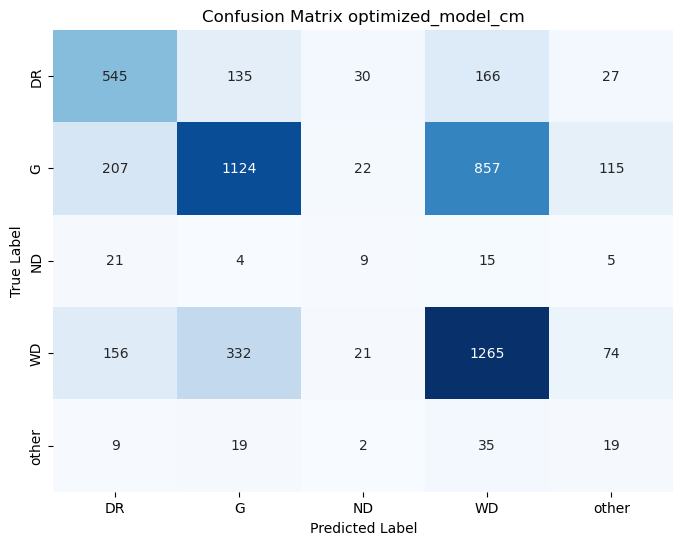

In [74]:
plot_confusion_matrix(y_om, y_hat_om, model_name='optimized_model_cm')

# Model Evaluation Discusion


The model with an F1 Score, Precision, and Recall of 0.5681 indicates a moderate model performance. Precision, also known as Positive Predictive Value, is the ratio of true positive predictions to the total number of positive predictions made by the model. A precision of 0.5681 indicates that roughly 56.81% of the instances predicted as positive by the model were actually true positives. Recall, also known as Sensitivity or True Positive Rate, is the ratio of true positive predictions to the total number of actual positive instances in the dataset.  A recall of 0.5681 means that the model captured roughly 56.81% of all the actual positive cases in the dataset.

### Confusion Matrix
The rows represent all the crop damage types in our dataset, respectively. The columns represent the images which the model predicted as drought, good growth, nutrient deficient, weeds and others respectively. Therefore, the diagonal of the matrix shows the images which were classified correctly, and the off-diagonal cells represent those which were classified incorrectly. 

# Results and Areas for Improvement

One of the main challenges we faced was the imbalance in the classes. Obviously this had an effect on the model. We tried oversampling of the minority class as a means of improving the model but the effects seem to be minimal. This could partially explain the low F1 score. We also experimented with incorporating class weighting into the model, but this led to an increase in overfitting rather than an improvement in performance.
Reflecting on this, we will explore a different way such as loss functions, which, in contrast to cross entropy, onsiders every label equally, accounting for the dataset's class imbalance.

We also intend to explore the fastai deep learning library which provides high level components that easily provide 'state-of-the-art-results'. For instance, it provides a flexible training loop and excellent out-of-the-box support for manipulating training parameters using strategies like the one cycle training strategy.

Another challenge was unning out of compute resources limiting the number of epochs we can run. Given enough computing resources we could run more epochs with guaranteed improvement to performance.

### Rank on Zindi

We are currently ranked 170/188 on the Zindi's competition page and working on to improve the rank to the first position.

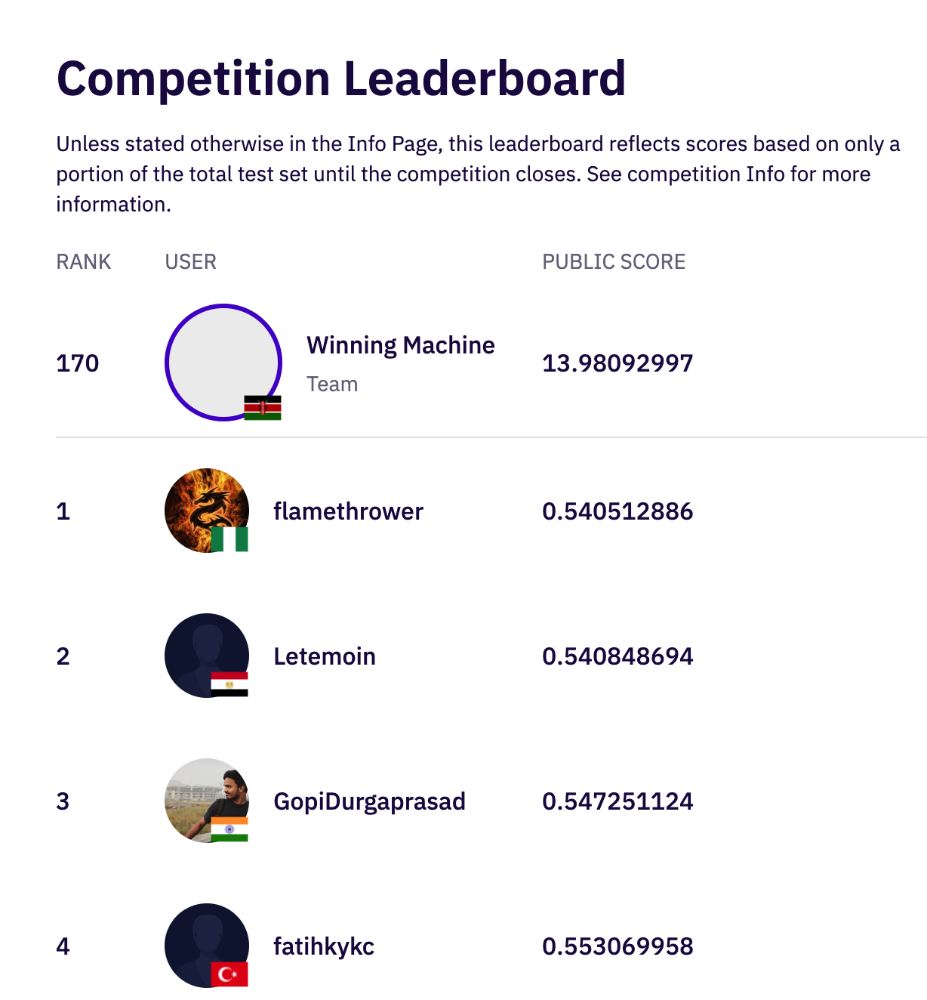